In [1]:
import os
import random
import cv2
import matplotlib.pyplot as plt

### Implementing Bilateral Filtering to reduce noise 

#### Step 1: Parameter tuning for Bilateral Filtering

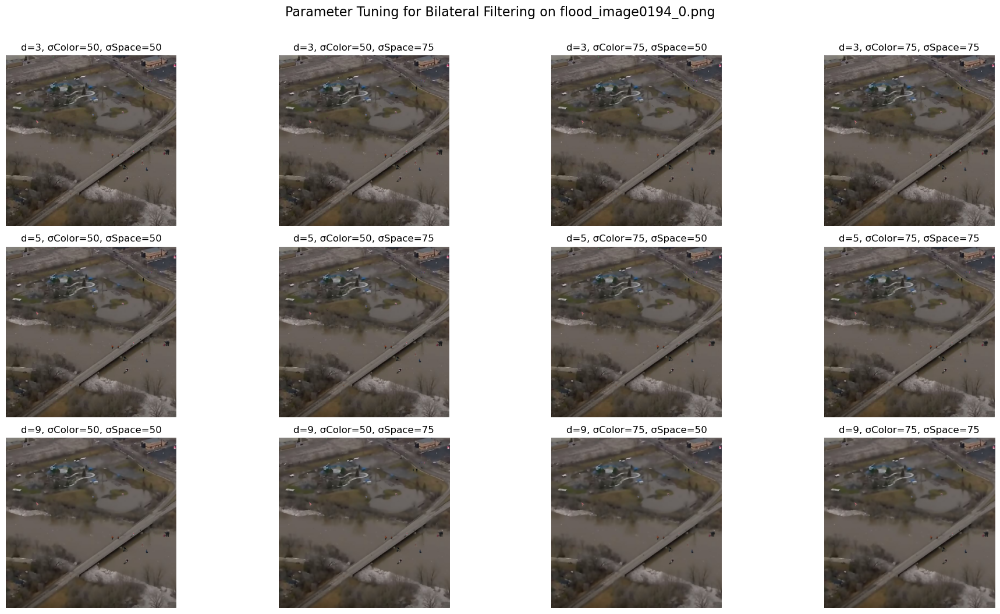

In [2]:

# Directory path containing images
image_dir = "./archive (19)/C2A_Dataset/new_dataset3/train/images"

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 1 image for parameter tuning
random_image = random.choice(image_files)
img_path = os.path.join(image_dir, random_image)

# Read the image
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct color display

# Define parameter ranges
d_values = [3, 5, 9]
sigmaColor_values = [50, 75]
sigmaSpace_values = [50, 75]

# Total number of parameter combinations
num_combinations = len(d_values) * len(sigmaColor_values) * len(sigmaSpace_values)

# Calculate grid size
num_rows = len(d_values)
num_cols = len(sigmaColor_values) * len(sigmaSpace_values)

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))

# Loop through parameter combinations and plot images
plot_num = 0
for i, d in enumerate(d_values):
    for j, sigmaColor in enumerate(sigmaColor_values):
        for k, sigmaSpace in enumerate(sigmaSpace_values):
            # Apply Bilateral Filtering with current parameters
            bilateral_filtered_image = cv2.bilateralFilter(image_rgb, d=d, sigmaColor=sigmaColor, sigmaSpace=sigmaSpace)

            # Get the current axis
            ax = axes[i, j * len(sigmaSpace_values) + k]
            ax.imshow(bilateral_filtered_image)
            ax.set_title(f"d={d}, σColor={sigmaColor}, σSpace={sigmaSpace}")
            ax.axis('off')

# Adjust layout and show the grid
plt.tight_layout()
plt.suptitle(f"Parameter Tuning for Bilateral Filtering on {random_image}", y=1.05, fontsize=16)
plt.show()


#### Step 2: Selected Parameters are implemented and output is plotted

#### Selected parameters are: d=5, sigmaColor=50, sigmaSpace=75

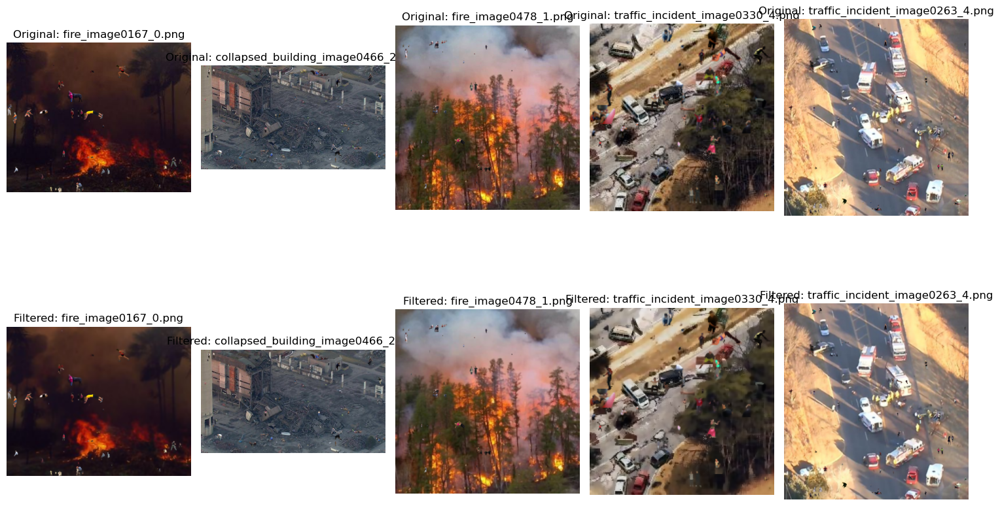

In [3]:
# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 5 images
random_images = random.sample(image_files, 5)

# Display original and preprocessed images
plt.figure(figsize=(15, 10))
for i, img_name in enumerate(random_images):
    # Read the image
    img_path = os.path.join(image_dir, img_name)
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct color display
    
    # Apply Bilateral Filtering
    bilateral_filtered_image = cv2.bilateralFilter(image_rgb, d=5, sigmaColor=50, sigmaSpace=75)
    
    # Plot the original image
    plt.subplot(2, 5, i + 1)
    plt.imshow(image_rgb)
    plt.title(f"Original: {img_name}")
    plt.axis('off')
    
    # Plot the preprocessed image
    plt.subplot(2, 5, i + 6)
    plt.imshow(bilateral_filtered_image)
    plt.title(f"Filtered: {img_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()


### Histogram Equalization to enhance image contrast
#### Step 1: Parameter tuning for Histogram Equalization

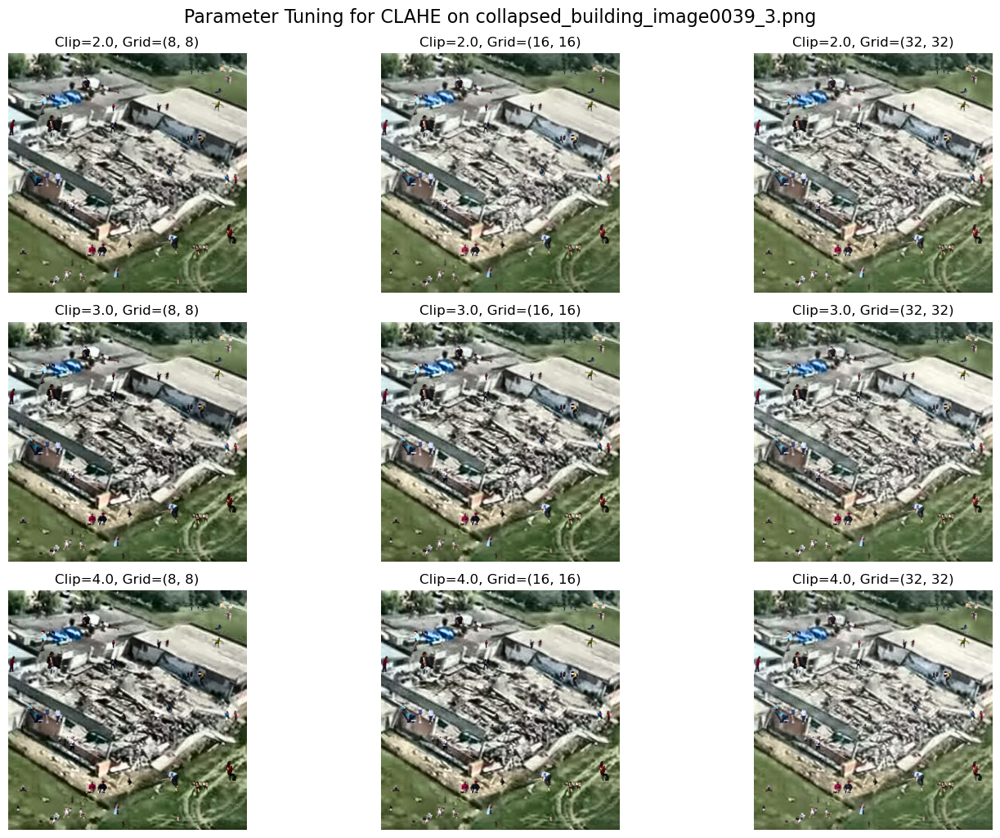

In [4]:
# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 1 image for parameter tuning
random_image = random.choice(image_files)
img_path = os.path.join(image_dir, random_image)

# Read the image
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

# Convert image to LAB color space
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab_image)  # Split into L, A, B channels

# Define parameter ranges for CLAHE
clip_limits = [2.0, 3.0, 4.0]  # Clip limits to prevent over-enhancement
tile_grid_sizes = [(8, 8), (16, 16), (32, 32)]  # Tile grid sizes for local equalization

# Total number of parameter combinations
num_combinations = len(clip_limits) * len(tile_grid_sizes)

# Create the figure and axes
fig, axes = plt.subplots(len(clip_limits), len(tile_grid_sizes), figsize=(15, 10))

# Loop through parameter combinations and apply CLAHE
for i, clip_limit in enumerate(clip_limits):
    for j, tile_grid_size in enumerate(tile_grid_sizes):
        # Apply CLAHE with current parameters
        clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
        l_equalized = clahe.apply(l)  # Apply to L channel
        
        # Merge the equalized L channel back with A and B channels
        lab_equalized = cv2.merge((l_equalized, a, b))
        
        # Convert back to RGB color space
        color_equalized_image = cv2.cvtColor(lab_equalized, cv2.COLOR_LAB2RGB)
        
        # Plot the result
        ax = axes[i, j]
        ax.imshow(color_equalized_image)
        ax.set_title(f"Clip={clip_limit}, Grid={tile_grid_size}")
        ax.axis('off')

# Adjust layout and show the grid
plt.tight_layout()
plt.suptitle(f"Parameter Tuning for CLAHE on {random_image}", y=1.02, fontsize=16)
plt.show()


### Step 2: Selected Parameters are implemented and output is plotted
#### Selected parameters are: clipLimit=4.0, tileGridSize=(8, 8)

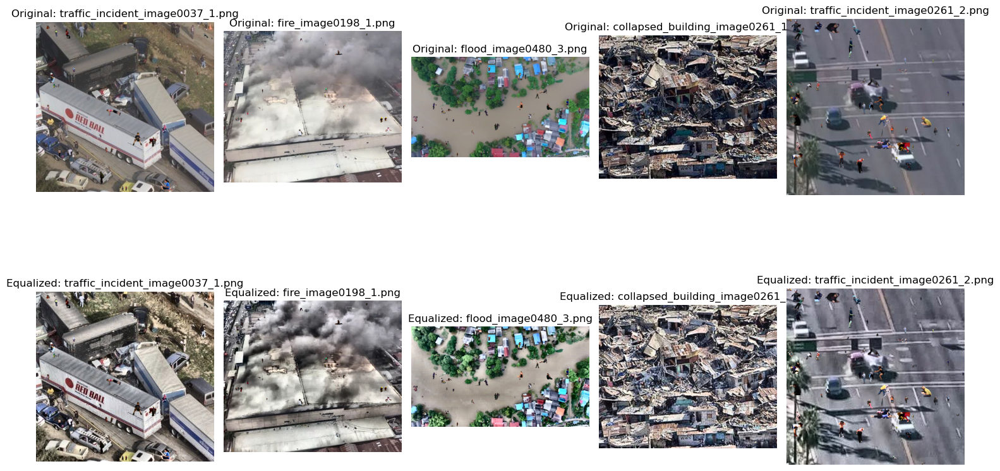

In [5]:
# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 5 images
random_images = random.sample(image_files, 5)

# Display original and Adaptive Histogram Equalized images
plt.figure(figsize=(15, 10))
for i, img_name in enumerate(random_images):
    # Read the image
    img_path = os.path.join(image_dir, img_name)
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
    
    # Convert image to LAB color space
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_image)  # Split into L, A, B channels
    
    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    l_equalized = clahe.apply(l)
    
    # Merge the equalized L channel back with A and B channels
    lab_equalized = cv2.merge((l_equalized, a, b))
    
    # Convert back to RGB color space
    color_equalized_image = cv2.cvtColor(lab_equalized, cv2.COLOR_LAB2RGB)
    
    # Plot the original image
    plt.subplot(2, 5, i + 1)
    plt.imshow(image_rgb)
    plt.title(f"Original: {img_name}")
    plt.axis('off')
    
    # Plot the Adaptive Histogram Equalized image
    plt.subplot(2, 5, i + 6)
    plt.imshow(color_equalized_image)
    plt.title(f"Equalized: {img_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()


### Combining both of the data preprocessing methods with the selected parameters

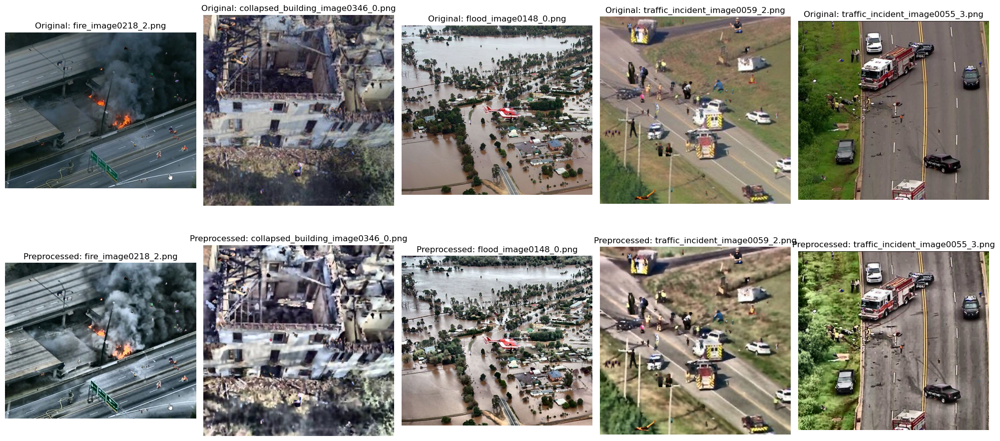

In [6]:
# Define the preprocessing pipeline
def preprocessing_pipeline(image):
    """
    Applies Bilateral Filtering and Adaptive Histogram Equalization (CLAHE) to the input image.

    Parameters:
    image (numpy array): Original image in BGR format.

    Returns:
    processed_image (numpy array): Preprocessed image in RGB format.
    """
    # Step 1: Apply Bilateral Filtering
    bilateral_filtered = cv2.bilateralFilter(image,  d=5, sigmaColor=50, sigmaSpace=75)
    
    # Step 2: Convert to LAB color space for CLAHE
    lab_image = cv2.cvtColor(bilateral_filtered, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_image)  # Split into L, A, B channels

    # Step 3: Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    l_equalized = clahe.apply(l)

    # Step 4: Merge the equalized L channel back with A and B channels
    lab_equalized = cv2.merge((l_equalized, a, b))

    # Step 5: Convert back to RGB color space
    processed_image = cv2.cvtColor(lab_equalized, cv2.COLOR_LAB2RGB)

    return processed_image

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 5 images
random_images = random.sample(image_files, 5)

# Display original and preprocessed images
plt.figure(figsize=(20, 10))
for i, img_name in enumerate(random_images):
    # Read the image
    img_path = os.path.join(image_dir, img_name)
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display

    # Apply the preprocessing pipeline
    processed_image = preprocessing_pipeline(image)

    # Plot the original image
    plt.subplot(2, 5, i + 1)
    plt.imshow(image_rgb)
    plt.title(f"Original: {img_name}")
    plt.axis('off')

    # Plot the preprocessed image
    plt.subplot(2, 5, i + 6)
    plt.imshow(processed_image)
    plt.title(f"Preprocessed: {img_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()